## 0. Setup

In [1]:
import numpy as np
import pandas as pd
import shap
from tqdm import tqdm
from matplotlib import pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from lightgbm import LGBMRegressor, LGBMClassifier, plot_tree, create_tree_digraph, plot_metric
import warnings
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from boruta import BorutaPy

import optuna.integration.lightgbm as opt_lgb
import optuna
from sklearn.model_selection import RepeatedKFold

import preprocessing as pp
import train_test_sets

warnings.filterwarnings('ignore')
pd.set_option('display.max_column', None)
pd.set_option('display.max_rows', None)


/home/brunovieira/.conda/envs/tamires/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#mri_subs_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_Data_Voxels_894.parquet"
#mri_areas_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_Data_Areas_890.csv" 
#ids_path = "/home/brunovieira/Tamires_Experiments/Bases_de_Dados/participants_nkienhanced.tsv"

mri_subs_path_v2 = "/home/brunovieira/backup/Tamires_Experiments/Bases_de_Dados/MRI_2_anualrate_894_v2.parquet" 
mri_subs_path_v1 = "/home/brunovieira/backup/Tamires_Experiments/Bases_de_Dados/MRI_2_anualrate_894.parquet"
dict_dkt_path = "/home/brunovieira/backup/Tamires_Experiments/Bases_de_Dados/Dict_structures_DKT.csv"
dict_econo_path = "/home/brunovieira/backup/Tamires_Experiments/Bases_de_Dados/Dict_structures.csv"
bb_path = "/home/brunovieira/backup/Tamires_Experiments/Bases_de_Dados/BigBrain.xlsx"

In [3]:
def read_database(atlas):
    if atlas == 'Economo':
        # read df
        df = pd.read_parquet(mri_subs_path_v1) 
        df[['hemisphere','atlasEcono', 'handedness','sex', 'age']] = df[['hemisphere','atlasEcono', 'handedness','sex', 'age']].astype('int32')
        # add bb
        df = pp.bb_features(bb_path, df)
        df = df.dropna()
        # add name strutures and lobes
        Dict_structures_econo = pd.read_csv(dict_econo_path, sep=';', header=None)
        df = df.merge(Dict_structures_econo, how='left', left_on='atlasEcono', right_on=0)
        df = df.rename(columns = {1:'lobe', 2:'structure_name'})
        df = df.drop(columns=0)
    if atlas == 'DKT':
        # read df
        df = pd.read_parquet(mri_subs_path_v2) 
        df = df[df.atlasDF != -1.0]
        df = df.rename(columns = {'h_atlasDF':'h_structure'})
        # add name strutures and lobes
        Dict_structures_dkt = pd.read_csv(dict_dkt_path, sep=',', header=None)
        Dict_structures_dkt = Dict_structures_dkt.rename(columns = {2:'structure_name', 3:'lobe_name', 4:'lobe' })
        Dict_structures_dkt = Dict_structures_dkt.drop(columns=[0,1])
        df = df.join(Dict_structures_dkt, on='atlasDF') 
    return df

In [4]:
df = read_database('Economo')
df[['hemisphere','atlasEcono', 'h_structure', 'structure_name','lobe']].head()

,hemisphere,atlasEcono,h_structure,structure_name,lobe
0,0,10,010,Orbital Area,1
1,0,11,011,Straight Area,1
2,0,12,012,Prefrontal Area,1
3,0,13,013,Frontal Piriform Area,1
4,0,18,018,Precentral Insular Area,2


In [5]:
#df = read_database('DKT')
#df[['hemisphere','atlasDF', 'h_structure', 'structure_name','lobe_name','lobe']].head()

In [6]:
df.head()

,participant,hemisphere,atlasEcono,area,curv,sulc,thickness,age,sex,handedness,h_structure,structure,ve_1,ve_2,ve_3,ve_4,ve_5,ve_6,bigbrain_layer_1,bigbrain_layer_2,bigbrain_layer_3,bigbrain_layer_4,bigbrain_layer_5,bigbrain_layer_6,bigbrain_layer_1_r,bigbrain_layer_2_r,bigbrain_layer_3_r,bigbrain_layer_4_r,bigbrain_layer_5_r,bigbrain_layer_6_r,bblayer1_age,bblayer2_age,bblayer3_age,bblayer4_age,bblayer5_age,bblayer6_age,ve1_age,ve2_age,ve3_age,ve4_age,ve5_age,ve6_age,lobe,structure_name
0,A00008326,0,10,0.674312,-0.071932,-0.772772,2.511595,59,0,2,010,FF,0.102041,0.034014,0.340136,0.017007,0.210884,0.295918,0.104651,0.085271,0.279070,0.065891,0.220930,0.244186,0.10,0.09,0.28,0.07,0.22,0.24,6.174418,5.031008,16.465117,3.887597,13.034883,14.406977,6.020408,2.006803,20.068027,1.003401,12.442177,17.459185,1,Orbital Area
1,A00008326,0,11,0.671304,-0.113367,-3.917485,2.039412,59,0,2,011,FG,0.099502,0.079602,0.159204,0.089552,0.174129,0.398010,0.122172,0.095023,0.266968,0.072398,0.212670,0.230769,0.12,0.10,0.27,0.07,0.21,0.23,7.208145,5.606335,15.751132,4.271493,12.547511,13.615385,5.870647,4.696517,9.393035,5.283582,10.273632,23.482588,1,Straight Area
2,A00008326,0,12,0.657484,-0.031216,0.759638,2.238305,59,0,2,012,FH,0.092437,0.046218,0.285714,0.063025,0.176471,0.336134,0.123016,0.103175,0.281746,0.075397,0.202381,0.214286,0.12,0.10,0.28,0.08,0.20,0.21,7.257936,6.087302,16.623016,4.448413,11.940476,12.642858,5.453782,2.726891,16.857143,3.718488,10.411765,19.831934,1,Prefrontal Area
3,A00008326,0,13,0.660866,0.057810,4.836751,3.139344,59,0,2,013,FJK,0.071979,0.020566,0.462725,0.012853,0.159383,0.272494,0.109541,0.088339,0.279152,0.056537,0.229682,0.236749,0.11,0.09,0.28,0.06,0.23,0.24,6.462897,5.212014,16.469965,3.335689,13.551237,13.968198,4.246787,1.213368,27.300770,0.758355,9.403599,16.077120,1,Frontal Piriform Area
4,A00008326,0,18,0.672671,0.004583,6.243018,3.035824,59,0,2,018,IA,0.075908,0.033003,0.231023,0.049505,0.214521,0.396040,0.115646,0.091837,0.275510,0.054422,0.224490,0.238095,0.12,0.09,0.28,0.05,0.22,0.24,6.823129,5.418367,16.255102,3.210884,13.244898,14.047619,4.478548,1.947195,13.630363,2.920792,12.656766,23.366337,2,Precentral Insular Area


In [7]:
len(df.participant.unique())

871

-------------------

## 1. Regressao Polinomial e Derivada da Espessura

In [8]:
# ordenacao
h_structures = np.sort(df.h_structure.unique())


taxa_anual =[]
for h_structure in tqdm(h_structures):
    
    # variacao da espessura
    age = df[df.h_structure == h_structure].age
    thickness = df[df.h_structure == h_structure].thickness
    z = np.polyfit(age, thickness, 3)
    p = np.poly1d(z)
    xp = np.linspace(10, 80, 100)
    
    # variacao da variacao da espessura
    p2 = np.polyder(p)
    derivada = []
    for year in range(0, 100):
        derivada.append(p2(year))
    taxa_anual.append([h_structure]+ derivada)
    
    # plots
    #fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7,14))
    #a = h_structure[1:]
    #b = ' - '#+df[df.h_structure == h_structure].name.iloc[0] 
    #c = ' - hemisphere '+ str(df[df.h_structure == h_structure].hemisphere.iloc[0])
    #fig.suptitle(a+b+c)
    
    #ax1.plot(age, thickness, '.',markersize=15 , color='0.6', alpha= 0.2)
    #ax1.plot(xp, p(xp), '-', linewidth=2, color='purple')
    #ax1.axis(ymin=1,ymax=4.5)
    
    #ax2.plot(derivada, linewidth=2, color='purple')
    #ax2.axis(ymin=-0.05,ymax=0.01)
    #ax2.axis(xmin=10,xmax=85)
    #ax2.fill_between([10,85], 0.003, 0, alpha=.2)
    
    
taxa_anual = pd.DataFrame(taxa_anual)
taxa_anual = taxa_anual.rename(columns={0: "Economo"})
taxa_anual.set_index('Economo', inplace=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 76/76 [00:01<00:00, 59.14it/s]


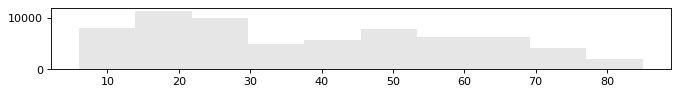

In [9]:
plt.figure(figsize=(10, 1), dpi=80)
plt.hist(df.age, color='0.9')
plt.show()

In [10]:
rate = 0.003
positives = df1[['Age','Hemisphere','atlasEcono', 'anual_rate']]
print(len(positives[positives.anual_rate > rate])/len(positives))
print(positives[positives.anual_rate > rate].atlasEcono.unique())
positives[positives.anual_rate > rate]

NameError: name 'df1' is not defined

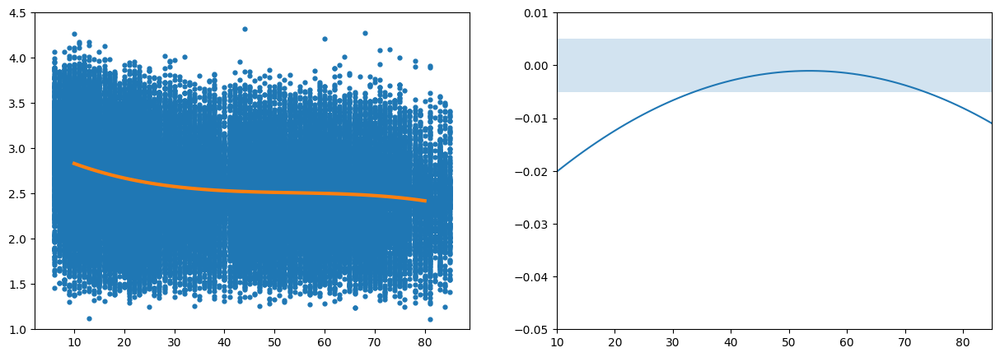

In [11]:
# variacao da espessura
age = df.age
thickness = df.thickness
z = np.polyfit(age, thickness, 3)
p = np.poly1d(z)
xp = np.linspace(10, 80, 100)

# variacao da variacao da espessura
p2 = np.polyder(p)
derivada = []
for year in range(0, 100):
    derivada.append(p2(year))

# plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
_ = ax1.plot(age, thickness, '.', xp, p(xp), '-', linewidth=3, markersize=7)
ax1.axis(ymin=1,ymax=4.5)
ax2.plot(derivada)
ax2.axis(ymin=-0.05,ymax=0.01)
ax2.axis(xmin=10,xmax=85)
ax2.fill_between([10,85], 0.005, -0.005, alpha=.2)

In [12]:
taxa_anual.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
Economo,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
010,-0.034602,-0.033335,-0.032092,-0.030873,-0.029677,-0.028505,-0.027356,-0.026231,-0.025130,-0.024052,-0.022998,-0.021967,-0.020960,-0.019977,-0.019017,-0.018081,-0.017169,-0.016280,-0.015415,-0.014574,-0.013756,-0.012961,-0.012191,-0.011444,-0.010720,-0.010020,-0.009344,-0.008692,-0.008063,-0.007457,-0.006876,-0.006317,-0.005783,-0.005272,-0.004785,-0.004321,-0.003881,-0.003465,-0.003072,-0.002703,-0.002358,-0.002036,-0.001737,-0.001463,-0.001212,-0.000984,-0.000780,-0.000600,-0.000444,-0.000311,-0.000202,-0.000116,-0.000054,-0.000015,-5.009252e-07,-0.000009,-0.000042,-0.000098,-0.000177,-0.000281,-0.000408,-0.000558,-0.000732,-0.000930,-0.001151,-0.001396,-0.001665,-0.001957,-0.002273,-0.002613,-0.002976,-0.003362,-0.003773,-0.004207,-0.004664,-0.005145,-0.005650,-0.006179,-0.006731,-0.007306,-0.007906,-0.008529,-0.009175,-0.009845,-0.010539,-0.011257,-0.011998,-0.012762,-0.013551,-0.014362,-0.015198,-0.016057,-0.016940,-0.017846,-0.018776,-0.019730,-0.020707,-0.021708,-0.022732,-0.023780
011,-0.035244,-0.033992,-0.032762,-0.031553,-0.030366,-0.029201,-0.028057,-0.026934,-0.025833,-0.024754,-0.023696,-0.022660,-0.021645,-0.020652,-0.019680,-0.018730,-0.017801,-0.016894,-0.016008,-0.015144,-0.014302,-0.013481,-0.012681,-0.011903,-0.011147,-0.010412,-0.009699,-0.009007,-0.008337,-0.007688,-0.007061,-0.006455,-0.005871,-0.005309,-0.004768,-0.004248,-0.003750,-0.003274,-0.002819,-0.002386,-0.001974,-0.001584,-0.001215,-0.000868,-0.000542,-0.000238,0.000045,0.000306,0.000545,0.000763,0.000960,0.001134,0.001288,0.001420,1.529945e-03,0.001619,0.001686,0.001732,0.001756,0.001758,0.001739,0.001699,0.001637,0.001553,0.001448,0.001322,0.001174,0.001004,0.000813,0.000600,0.000366,0.000110,-0.000167,-0.000466,-0.000787,-0.001129,-0.001492,-0.001877,-0.002284,-0.002712,-0.003162,-0.003633,-0.004125,-0.004640,-0.005176,-0.005733,-0.006312,-0.006912,-0.007534,-0.008178,-0.008843,-0.009529,-0.010237,-0.010967,-0.011718,-0.012491,-0.013285,-0.014101,-0.014938,-0.015797
012,-0.033226,-0.032147,-0.031086,-0.030042,-0.029015,-0.028007,-0.027015,-0.026041,-0.025085,-0.024146,-0.023225,-0.022321,-0.021434,-0.020565,-0.019714,-0.018880,-0.018063,-0.017264,-0.016482,-0.015718,-0.014972,-0.014243,-0.013531,-0.012837,-0.012160,-0.011501,-0.010859,-0.010235,-0.009628,-0.009039,-0.008467,-0.007913,-0.007376,-0.006857,-0.006355,-0.005871,-0.005404,-0.004955,-0.004523,-0.004109,-0.003712,-0.003332,-0.002970,-0.002626,-0.002299,-0.001989,-0.001697,-0.001423,-0.001166,-0.000926,-0.000704,-0.000500,-0.000313,-0.000143,9.042508e-06,0.000144,0.000261,0.000360,0.000443,0.000507,0.000555,0.000584,0.000596,0.000591,0.000569,0.000528,0.000471,0.000395,0.000303,0.000193,0.000065,-0.000080,-0.000243,-0.000423,-0.000620,-0.000836,-0.001068,-0.001318,-0.001586,-0.001871,-0.002173,-0.002493,-0.002831,-0.003186,-0.003558,-0.003948,-0.004355,-0.004780,-0.005223,-0.005682,-0.006160,-0.006655,-0.007167,-0.007697,-0.008244,-0.008809,-0.009391,-0.009991,-0.010608,-0.011243
013,-0.025633,-0.024928,-0.024235,-0.023552,-0.022880,-0.022219,-0.021569,-0.020930,-0.020302,-0.019684,-0.019077,-0.018482,-0.017897,-0.017323,-0.016759,-0.016207,-0.015666,-0.015135,-0.014615,-0.014106,-0.013608,-0.013121,-0.012645,-0.012179,-0.011725,-0.011281,-0.010848,-0.010426,-0.010015,-0.009615,-0.009225,-0.008847,-0.008479,-0.008122,-0.007776,-0.007441,-0.007117,-0.006804,-0.006501,-0.006209,-0.005929,-0.005659,-0.005400,-0.005151,-0.004914,-0.004687,-0.004472,-0.004267,-0.004073,-0.003890,-0.003718,-0.003557,-0.003406,-0.003266,-3.137698e-03,-0.003020,-0.002913,-0.002817,-0.002731,-0.002657,-0.002593,

-------------------

## 2. Modelagem para prever variação de espessura anual

#### 2.1. DataSet

In [13]:
def rate(h_structure, age):
    return taxa_anual.loc[h_structure, age]

# add anual rate
df1 = df.copy()
df1['anual_rate'] = df1.apply(lambda x: rate(x.h_structure, x.age), axis=1)

# add initial thickness (at 10 years)
thickness10 = df1[df1.age == 10][['h_structure', 'thickness']].groupby(['h_structure']).mean()
thickness10 = thickness10.rename(columns={'thickness':'thickness10'})
thickness10 = thickness10.round(2)
df1 = df1.merge(thickness10, on='h_structure')

thickness_mean = df1[['h_structure', 'thickness']].groupby(['h_structure']).mean()
thickness_mean = thickness_mean.rename(columns={'thickness':'thickness_mean'})
#thickness_mean = thickness_mean.round(2)
df1 = df1.merge(thickness_mean, on='h_structure')

# uni os dados de cada idade
dfs = []
for h_structure in df.h_structure.unique():
    df0 = df1[df1.h_structure == h_structure].groupby(['age']).mean()
    df0['h_structure'] = h_structure
    df0['structure_name'] = np.array(df[df.h_structure == h_structure].structure_name[:1])[0]
    dfs.append(df0.reset_index())

df1 = pd.concat(dfs).reset_index(drop=True)

# check sum layers thickness
df1['thickness_layer_1'] = df1.thickness * df1.bigbrain_layer_1
df1['thickness_layer_2'] = df1.thickness * df1.bigbrain_layer_2
df1['thickness_layer_3'] = df1.thickness * df1.bigbrain_layer_3
df1['thickness_layer_4'] = df1.thickness * df1.bigbrain_layer_4
df1['thickness_layer_5'] = df1.thickness * df1.bigbrain_layer_5
df1['thickness_layer_6'] = df1.thickness * df1.bigbrain_layer_6
df1['sum_thickness_layers'] = df1['thickness_layer_1']+ df1['thickness_layer_2']+df1['thickness_layer_3']+df1['thickness_layer_4']+df1['thickness_layer_5']+df1['thickness_layer_6']
df1[['sum_thickness_layers', 'thickness']]

# rename
df1.rename(columns= {'hemisphere':'Hemisphere',
                     'sex':'Gender', 
                     'age':'Age',
                     'lobe':'Lobe',
                     'thickness_layer_1': 'Layer I thickness',
                     'thickness_layer_2': 'Layer II thickness',
                     'thickness_layer_3': 'Layer III thickness',
                     'thickness_layer_4': 'Layer IV thickness',
                     'thickness_layer_5': 'Layer V thickness',
                     'thickness_layer_6': 'Layer VI thickness',
                     'thickness10':'Thickness at 10y.o.',
                     'sulc':'Curvature'
                     
                       }, inplace=True)


# show
df1.head()

,Age,Hemisphere,atlasEcono,area,curv,Curvature,thickness,Gender,handedness,ve_1,ve_2,ve_3,ve_4,ve_5,ve_6,bigbrain_layer_1,bigbrain_layer_2,bigbrain_layer_3,bigbrain_layer_4,bigbrain_layer_5,bigbrain_layer_6,bigbrain_layer_1_r,bigbrain_layer_2_r,bigbrain_layer_3_r,bigbrain_layer_4_r,bigbrain_layer_5_r,bigbrain_layer_6_r,bblayer1_age,bblayer2_age,bblayer3_age,bblayer4_age,bblayer5_age,bblayer6_age,ve1_age,ve2_age,ve3_age,ve4_age,ve5_age,ve6_age,Lobe,anual_rate,Thickness at 10y.o.,thickness_mean,h_structure,structure_name,Layer I thickness,Layer II thickness,Layer III thickness,Layer IV thickness,Layer V thickness,Layer VI thickness,sum_thickness_layers
0,6,0.0,10.0,0.679858,-0.057141,-0.332572,3.123001,0.714286,1.857143,0.102041,0.034014,0.340136,0.017007,0.210884,0.295918,0.104651,0.085271,0.27907,0.065891,0.22093,0.244186,0.1,0.09,0.28,0.07,0.22,0.24,0.627907,0.511628,1.674419,0.395349,1.325581,1.465116,0.612245,0.204082,2.040816,0.102041,1.265306,1.775510,1.0,-0.028505,3.06,2.723924,010,Orbital Area,0.326826,0.266302,0.871535,0.205779,0.689965,0.762593,3.123001
1,7,0.0,10.0,0.679828,-0.060188,-0.378362,2.968792,0.000000,1.666667,0.102041,0.034014,0.340136,0.017007,0.210884,0.295918,0.104651,0.085271,0.27907,0.065891,0.22093,0.244186,0.1,0.09,0.28,0.07,0.22,0.24,0.732558,0.596899,1.953488,0.461240,1.546512,1.709302,0.714286,0.238095,2.380952,0.119048,1.476190,2.071429,1.0,-0.027356,3.06,2.723924,010,Orbital Area,0.310688,0.253153,0.828500,0.195618,0.655896,0.724938,2.968792
2,8,0.0,10.0,0.675299,-0.059163,-0.183841,3.086555,0.333333,1.666667,0.102041,0.034014,0.340136,0.017007,0.210884,0.295918,0.104651,0.085271,0.27907,0.065891,0.22093,0.244186,0.1,0.09,0.28,0.07,0.22,0.24,0.837209,0.682171,2.232558,0.527132,1.767442,1.953488,0.816327,0.272109,2.721088,0.136054,1.687075,2.367347,1.0,-0.026231,3.06,2.723924,010,Orbital Area,0.323012,0.263195,0.861364,0.203378,0.681913,0.753694,3.086555
3,9,0.0,10.0,0.684568,-0.055530,-0.199519,3.017535,0.357143,1.642857,0.102041,0.034014,0.340136,0.017007,0.210884,0.295918,0.104651,0.085271,0.27907,0.065891,0.22093,0.244186,0.1,0.09,0.28,0.07,0.22,0.24,0.941860,0.767442,2.511628,0.593023,1.988372,2.197674,0.918367,0.306122,3.061224,0.153061,1.897959,2.663265,1.0,-0.025130,3.06,2.723924,010,Orbital Area,0.315789,0.257309,0.842103,0.198830,0.666665,0.736840,3.017535
4,10,0.0,10.0,0.682791,-0.053920,-0.180963,3.062818,0.500000,1.833333,0.102041,0.034014,0.340136,0.017007,0.210884,0.295918,0.104651,0.085271,0.27907,0.065891,0.22093,0.244186,0.1,0.09,0.28,0.07,0.22,0.24,1.046512,0.852713,2.790698,0.658915,2.209302,2.441860,1.020408,0.340136,3.401361,0.170068,2.108844,2.959184,1.0,-0.024052,3.06,2.723924,010,Orbital Area,0.320527,0.261171,0.854740,0.201814,0.676669,0.747897,3.062818


In [14]:
df1.columns

Index(['Age', 'Hemisphere', 'atlasEcono', 'area', 'curv', 'Curvature',
       'thickness', 'Gender', 'handedness', 've_1', 've_2', 've_3', 've_4',
       've_5', 've_6', 'bigbrain_layer_1', 'bigbrain_layer_2',
       'bigbrain_layer_3', 'bigbrain_layer_4', 'bigbrain_layer_5',
       'bigbrain_layer_6', 'bigbrain_layer_1_r', 'bigbrain_layer_2_r',
       'bigbrain_layer_3_r', 'bigbrain_layer_4_r', 'bigbrain_layer_5_r',
       'bigbrain_layer_6_r', 'bblayer1_age', 'bblayer2_age', 'bblayer3_age',
       'bblayer4_age', 'bblayer5_age', 'bblayer6_age', 've1_age', 've2_age',
       've3_age', 've4_age', 've5_age', 've6_age', 'Lobe', 'anual_rate',
       'Thickness at 10y.o.', 'thickness_mean', 'h_structure',
       'structure_name', 'Layer I thickness', 'Layer II thickness',
       'Layer III thickness', 'Layer IV thickness', 'Layer V thickness',
       'Layer VI thickness', 'sum_thickness_layers'],
      dtype='object')

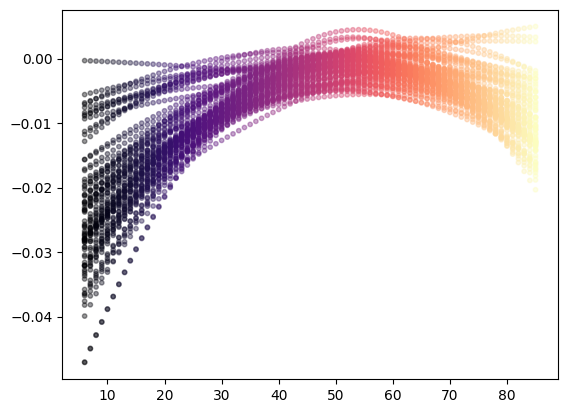

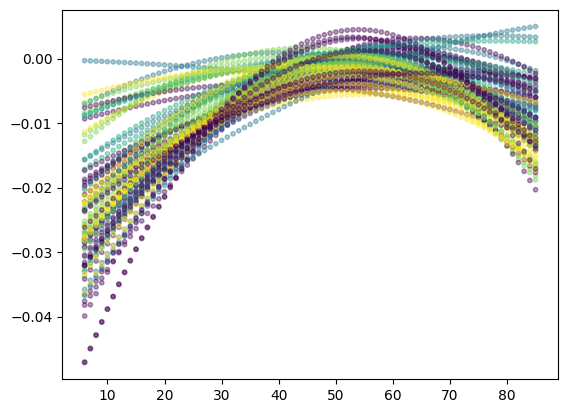

In [15]:
plt.scatter(df1.Age, df1.anual_rate, alpha=0.4, c=df1.Age, cmap=plt.cm.magma, s=10)
plt.show()
plt.scatter(df1.Age, df1.anual_rate, alpha=0.4, c=df1.Lobe, cmap=plt.cm.viridis, s=10)
plt.show()

#### 2.2. Feature Analyses and Selection

In [16]:
features_sets = [['Age'],
                 
                 ['Thickness at 10y.o.', 
                  'Curvature', 
                  'Hemisphere', 'Gender',
                  'Lobe', 
                  'Layer I thickness','Layer II thickness','Layer III thickness',
                  'Layer IV thickness','Layer V thickness','Layer VI thickness'],
    
                 ['Age','Thickness at 10y.o.', 
                  'Curvature', 
                  'Hemisphere', 'Gender',
                  'Lobe', 
                  'Layer I thickness','Layer II thickness','Layer III thickness',
                  'Layer IV thickness','Layer V thickness','Layer VI thickness'],
                 
                ]


In [18]:
features_sets = [['Age'],
                 ['Age','Thickness at 10y.o.'],
                 ['Age','Layer I thickness'],
                 ['Age','Layer II thickness'],
                 ['Age','Layer III thickness'],
                 ['Age','Layer IV thickness'],
                 ['Age','Layer V thickness'],
                 ['Age','Layer VI thickness']]

In [24]:
features_sets = [['Age'],
                 
                 ['Thickness at 10y.o.', 
                  'Curvature', 
                  'Hemisphere', 'Gender',
                  'Lobe', 
                  'bigbrain_layer_1', 'bigbrain_layer_2','bigbrain_layer_3', 
                  'bigbrain_layer_4', 'bigbrain_layer_5','bigbrain_layer_6'],
    
                 ['Age','Thickness at 10y.o.', 
                  'Curvature', 
                  'Hemisphere', 'Gender',
                  'Lobe', 
                  'bigbrain_layer_1', 'bigbrain_layer_2','bigbrain_layer_3', 
                  'bigbrain_layer_4', 'bigbrain_layer_5','bigbrain_layer_6']
                 
                ]


#### 2.4. Model Training and Testing

In [25]:
inexplicable_strutures = {}
for key in pd.Series([x[1:] for x in df1.h_structure.unique()]).unique():
    inexplicable_strutures[key]=0
    
list_performance = []
testes = []
shap_info = []
lgbm_dict_list = []
X_train_dict_list = []
Xy_dict_list = []

for features in tqdm(features_sets):    

    X = df1[features]
    y = df1.anual_rate
    performance = []
    lgbm_dict = {}
    X_train_dict = {}
    shap_values_ = {}
    expected_value = {}
    Xy_dict = {}
    
    for i, struture in enumerate(set([x[1:] for x in df1.h_structure.unique()])):

        # Train Test Split
        test_index = df1[(df1.h_structure=='1'+struture)|(df1.h_structure=='0'+struture)].index
        train_index = set(df1.index)-set(test_index)
        X_train = X.loc[train_index]
        X_test = X.loc[test_index]
        y_train = y.loc[train_index]
        y_test = y.loc[test_index]
        
        # Model Train
        lgbm_dict[i] = LGBMRegressor()
        lgbm_dict[i].fit(X_train, y_train) #, categorical_feature = categorical_feature #fode o modelo usar categoricas
        
        # Model Test
        y_pred = lgbm_dict[i].predict(X_test)
        r2 = r2_score(y_test, y_pred)
        
        # SHAP
        X_train_dict[i] = X_train
        Xy_dict[i] = [X_train,X_test,y_train,y_test]
        
        # Save Performance
        performance.append([struture,r2])
    
    # Save SHAP
    shap_info.append([[features], shap_values_, X_train_dict, expected_value])
    lgbm_dict_list.append(lgbm_dict)
    X_train_dict_list.append(X_train_dict)
    Xy_dict_list.append(Xy_dict)
    
    # Ajust and save to List of all Performance
    performance = pd.DataFrame(performance).sort_values(by=1, ascending=False)
    performance.columns = ['struture','r2']#+features
    performance['features'] = [features]*len(performance)
    list_performance.append(performance)
    
    # Handling Inexplicable strutures
    for key in performance[performance.r2<0].struture:
        inexplicable_strutures[key]=inexplicable_strutures[key]+1
    testes.append([features, performance.mean()[1], performance[performance.r2>0].mean()[1], len(performance[performance.r2<0])])
    
# Finishing
testes = pd.DataFrame(testes).rename(columns={0:'features',1:'r2_all',2:'r2_clean',3:'inexplicable_strutures'})

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:08<00:00,  8.28s/it]


In [ ]:
Xy_dict

In [27]:
performance
# r2_spatial, r2_temporal, r2_complete, boruta, y

,struture,r2,features
34,42,0.984162,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
8,34,0.976106,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
33,22,0.964975,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
22,37,0.963599,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
15,10,0.960236,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
4,35,0.958845,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
14,20,0.957684,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
3,19,0.947214,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
16,6,0.946659,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."
18,33,0.945496,"[Age, Thickness at 10y.o., Curvature, Hemisphe..."


In [26]:
forest = RandomForestRegressor(n_jobs=-1, max_depth=20)
forest.fit(X_train, y_train)

feat_selector = BorutaPy(forest, n_estimators='auto', verbose=2, random_state=1, alpha= 0.001)
feat_selector.fit(X_train.to_numpy(), y_train)

feature_ranks = pd.DataFrame(list(zip(X_train.columns, 
                         feat_selector.ranking_, 
                         feat_selector.support_,
                         #forest.feature_importances_
                        )))
feature_ranks

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	10 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	11 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	12 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	13 / 100
Confirmed: 	0
Tentative: 	12
Rejected: 	0
Iteration: 	14 / 100
Confirmed: 	11
Tentative: 	1
Rejected: 	0
Iteration: 	15 / 100
Confirmed: 	11
Tentative: 	1
Rejected: 	0
Iteration: 	16 / 100
Confirmed: 	11
Tentative: 	1
Rejected: 	0
I

,0,1,2
0,Age,1,True
1,Thickness at 10y.o.,1,True
2,Curvature,1,True
3,Hemisphere,1,True
4,Gender,2,False
5,Lobe,1,True
6,bigbrain_layer_1,1,True
7,bigbrain_layer_2,1,True
8,bigbrain_layer_3,1,True
9,bigbrain_layer_4,1,True


#### 2.4. Model Evaluation

In [21]:
testes

,features,r2_all,r2_clean,inexplicable_strutures
0,[Age],-0.178605,0.798140,6
1,"[Age, Thickness at 10y.o.]",-0.388096,0.652711,5
2,"[Age, Layer I thickness]",0.033538,0.747282,5
3,"[Age, Layer II thickness]",-0.105485,0.768127,6
4,"[Age, Layer III thickness]",-0.130272,0.727750,5
5,"[Age, Layer IV thickness]",-0.066208,0.735019,5
6,"[Age, Layer V thickness]",-0.437220,0.724781,5
7,"[Age, Layer VI thickness]",-0.298603,0.753462,5


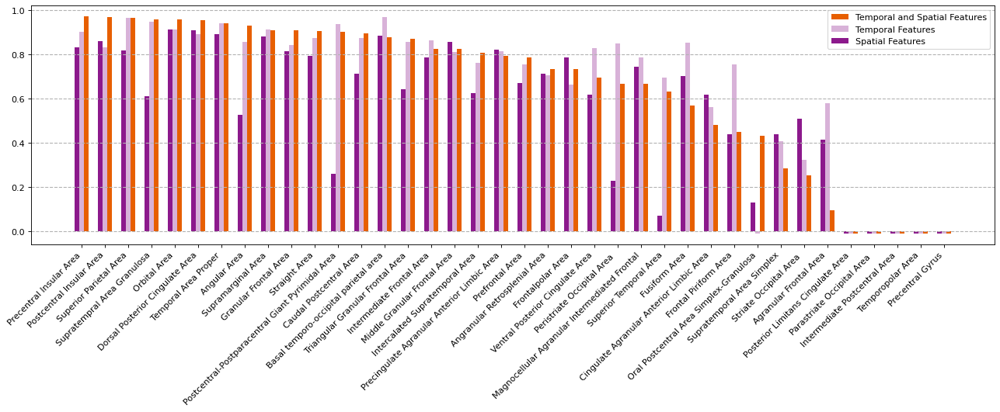

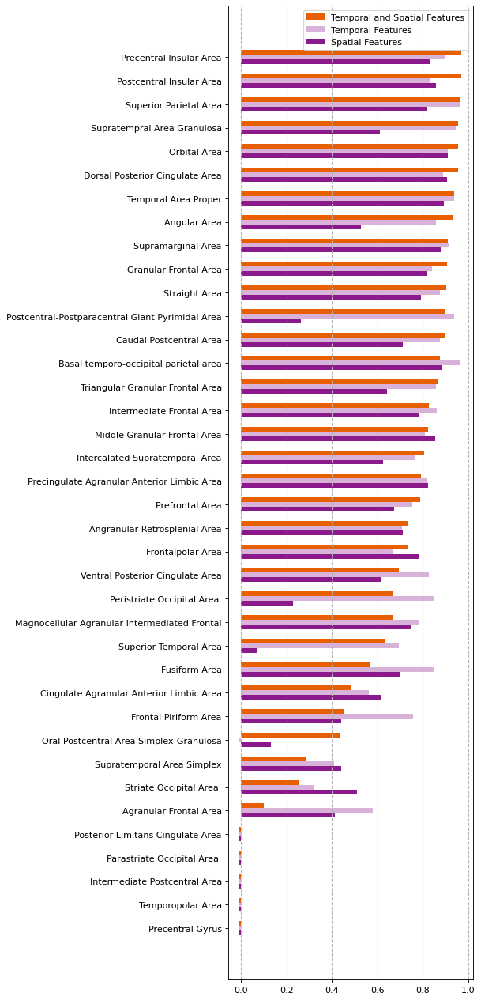

In [22]:
# unindo performace
df_performance = pd.concat([list_performance[2].rename(columns={'r2':'r2.2'}).drop(columns='features'),
                            list_performance[0].rename(columns={'r2':'r2.0'}).drop(columns=['features','struture']),
                            list_performance[1].rename(columns={'r2':'r2.1'}).drop(columns=['features','struture'])],
                           axis=1)
df_performance = df_performance.sort_values(by='r2.2',ascending=False).astype(float)
df_performance = pd.merge(df_performance,
                          df1[['structure_name','atlasEcono']].drop_duplicates(),
                          left_on="struture", right_on="atlasEcono")

# inexplicaveis
df_performance['r2.0'] = df_performance['r2.0'].mask(df_performance['r2.0'] < 0, -0.01) 
df_performance['r2.1'] = df_performance['r2.1'].mask(df_performance['r2.1'] < 0, -0.01) 
df_performance['r2.2'] = df_performance['r2.2'].mask(df_performance['r2.2'] < 0, -0.01)
df_performance['struture'].astype(str)
df_performance.reset_index(inplace=True)

# avarage
#line = pd.DataFrame({'structure_name':'Average', 'struture':'Average','r2.0':testes.r2_clean[0],'r2.1':testes.r2_clean[1],'r2.2':testes.r2_clean[2],'index':-1},index=[0])
#df_performance = line.append(df_performance).reset_index(drop=True)

# plot
plt.figure(figsize=(20, 5), dpi=80)
plt.bar(df_performance.index+0.2, df_performance['r2.2'], width=0.2, label = 'Temporal and Spatial Features',color='#e75f00',alpha=1)
plt.bar(df_performance.index+0.0, df_performance['r2.0'], width=0.2, label = 'Temporal Features',color='purple',alpha=0.3)
plt.bar(df_performance.index-0.2, df_performance['r2.1'], width=0.2, label = 'Spatial Features',color='purple',alpha=0.9)
plt.xticks(df_performance.index, df_performance.structure_name, rotation = 45, horizontalalignment = 'right')
plt.legend(loc='upper right')
plt.grid(axis='y',color='0.7', linestyle='--', linewidth=1)
plt.show()

# plot
plt.figure(figsize=(5, 20), dpi=80)
plt.barh(-df_performance.index+0.2, df_performance['r2.2'], height=0.2, label = 'Temporal and Spatial Features',color='#e75f00',alpha=1)
plt.barh(-df_performance.index+0.0, df_performance['r2.0'], height=0.2, label = 'Temporal Features',color='purple',alpha=0.3)
plt.barh(-df_performance.index-0.2, df_performance['r2.1'], height=0.2, label = 'Spatial Features',color='purple',alpha=0.9)
plt.yticks(-df_performance.index, df_performance.structure_name, horizontalalignment = 'right')
plt.legend()
plt.grid(axis='x',color='0.7', linestyle='--', linewidth=1)
plt.show()


In [23]:
model = 2
explicables = list_performance[model][list_performance[model].r2 >0].struture
explicables_index = explicables.index.tolist()
explicables = [int(x) for x in explicables.tolist()]

inexplicables = list_performance[model][list_performance[model].r2 <0].struture
inexplicables = [int(x) for x in inexplicables.tolist()]
inexplicables

[24, 28, 32, 44, 2]

#### File to vizualization in the cortex

In [24]:
df_vizualization = df1[['h_structure', 'atlasEcono','Hemisphere','Lobe','Thickness at 10y.o.','Curvature',
                        'Layer I thickness','Layer II thickness','Layer III thickness',
                        'Layer IV thickness','Layer V thickness','Layer VI thickness',
                        'bigbrain_layer_1', #'bigbrain_layer_2','bigbrain_layer_3', 
                        #'bigbrain_layer_4', 'bigbrain_layer_5','bigbrain_layer_6'
                       ]].groupby(['h_structure']).mean()
df_vizualization = pd.merge(df_vizualization, df_performance.loc[1:,['r2.0','r2.1','r2.2', 'struture']],
                            left_on="atlasEcono", right_on="struture")
#df_vizualization.to_csv('vizualizations_economo_model.csv')

## 3. Explicabilidade

#### 3.1 Explicando Modelos Cross-Validation SHAP

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:17<00:00,  1.84it/s]


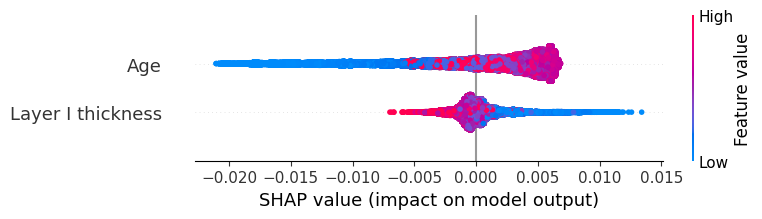

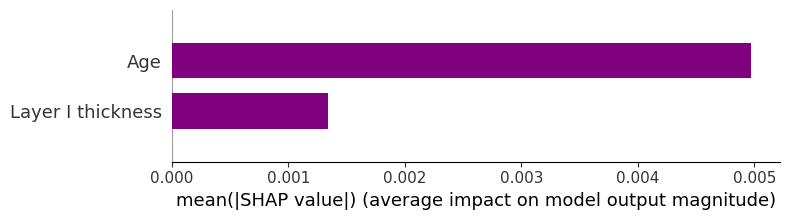

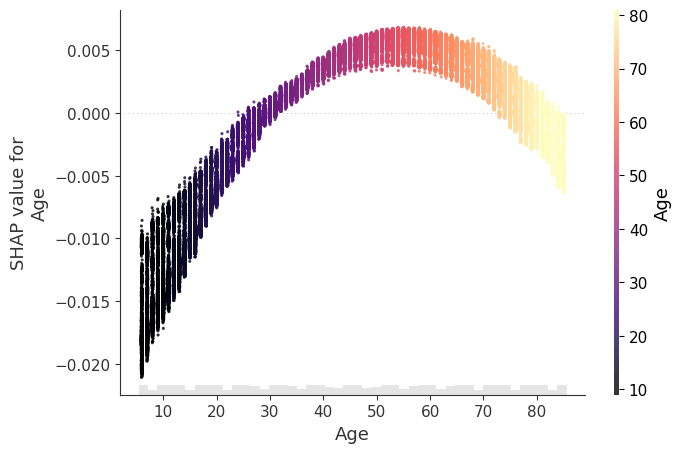

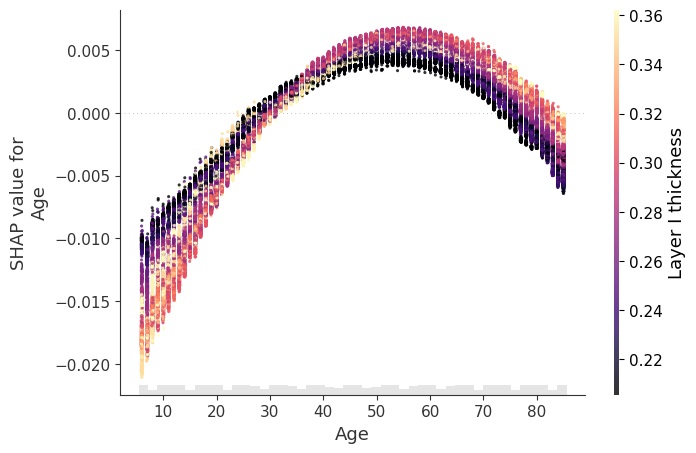

IndexError: index 2 is out of bounds for axis 1 with size 2

In [25]:
model=2

#for model in [1,2,3,4,5,7]:
explainer = shap.Explainer(lgbm_dict_list[model][0])
shap_complete = explainer(X_train_dict_list[model][0])
for i in tqdm(explicables_index):
    explainer = shap.Explainer(lgbm_dict_list[model][i])
    shap_values = explainer(X_train_dict_list[model][i])
    shap_complete.values = np.append(shap_complete.values, shap_values.values,axis=0)
    shap_complete.base_values = np.append(shap_complete.base_values, shap_values.base_values,axis=0)
    shap_complete.data = np.append(shap_complete.data, shap_values.data,axis=0)

# shap plot principal    
shap.summary_plot(shap_complete)
shap.summary_plot(shap_complete, plot_type='bar',color='purple')

for i in range(12):

    shap.plots.scatter(shap_complete[:, "Age"], color=shap_complete[:,i], dot_size=5, cmap=plt.cm.magma, alpha =0.8) 
    #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,"Lobe"], dot_size=5, cmap=plt.cm.viridis, alpha =0.8)
    #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,'Layer I thickness'], dot_size=5, cmap=plt.cm.plasma, alpha =0.8)
    #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,'Thickness at 10y.o.'], dot_size=5, cmap=plt.cm.plasma, alpha =0.8)
    #shap.plots.scatter(shap_complete[:, i], color=shap_complete[:,'thickness_mean'], dot_size=5, cmap=plt.cm.plasma, alpha =0.8)
    

In [ ]:
a = 0.001/9
age=0.005 + a
L1=6*a
L2=2.5*a
L3=a
L4=5*a
L5=2.5*a
L6=2.5*a
b = L1+L2+L3+L4+L5+L6
b

In [ ]:
b/age*100

In [ ]:
5/50*100

In [ ]:
df1_.anual_rate.mean()

#### 3.2 One Model SHAP

In [ ]:
# Take inexplicables
atlas = 'atlasEcono'
df1_ = df1[df1[atlas].isin(explicables)] 
print(len(df1[atlas].unique()))
print(len(df1_[atlas].unique()))

# Train-Test
X = df1_[features_sets[model]]
y = df1_.anual_rate

# Final Model
lgbm = LGBMRegressor()
lgbm.fit(X, y)

# SHAP
explainer = shap.Explainer(lgbm)
shap_info = explainer(X)

shap.summary_plot(shap_info)
shap.summary_plot(shap_info, plot_type='bar',color='purple')

for i in range(len(X.columns)):
    shap.plots.scatter(shap_info[:, i], color=shap_info[:,"Age"], dot_size=10, cmap=plt.cm.magma)
    shap.plots.scatter(shap_info[:, i], color=shap_info[:,"Lobe"], dot_size=10, cmap=plt.cm.viridis)
    shap.plots.scatter(shap_info[:, i], color=shap_info[:,'Layer I thickness'], dot_size=10, cmap=plt.cm.plasma)

In [ ]:
#explainer = shap.TreeExplainer(model)
shap_interaction = explainer.shap_interaction_values(X)

# Get absolute mean of matrices
mean_shap = np.abs(shap_interaction).mean(0)
df = pd.DataFrame(mean_shap,index=X.columns,columns=X.columns)

# times off diagonal by 2
df.where(df.values == np.diagonal(df),df.values*2,inplace=True)

# display 
plt.figure(figsize=(30, 30), facecolor='w', edgecolor='k')
sns.set(font_scale=2)
sns.heatmap(df,cmap='coolwarm',annot=True,fmt='.3g',cbar=False)
plt.yticks(rotation=0) 

In [ ]:
df

#### 3.3 Plot Interativo 

In [131]:
from random import sample
sample = sample(range(201246),10)
sample = list(sample)
sample

[71315, 8864, 38001, 173181, 41572, 159347, 176253, 123121, 102483, 23913]

In [190]:
list1 = np.array([[1,2],[2,3],[3,1],[4,2],[5,3],[6,1],[7,2],[8,3],[9,1]])
list1 = shuffle(list1, random_state=0)
list1

array([[8, 3],
       [3, 1],
       [2, 3],
       [5, 3],
       [9, 1],
       [7, 2],
       [4, 2],
       [1, 2],
       [6, 1]])

In [196]:
#from sklearn.utils import shuffle
list2 = np.array([np.array([10,2]),np.array([20,3]),np.array([30,1]),np.array([40,2]),np.array([50,3]),np.array([60,1]),np.array([70,2]),np.array([80,3]),np.array([90,1])])
list2 = shuffle(list2, random_state=0)
list2

array([[80,  3],
       [30,  1],
       [20,  3],
       [50,  3],
       [90,  1],
       [70,  2],
       [40,  2],
       [10,  2],
       [60,  1]])

In [197]:
shap_complete.shape, shap_complete.values.shape, shap_complete.base_values.shape, shap_complete.data.shape

((201246, 12), (201246, 12), (201246,), (201246, 12))

In [205]:
shap_complete

.values =
array([[-1.87419752e-02,  1.06910050e-04, -3.34708848e-04, ...,
        -1.07670615e-03,  5.79654653e-04, -5.99761507e-04],
       [-1.82949725e-02,  3.38294639e-05, -1.59827724e-04, ...,
        -8.44958373e-04,  6.31573271e-05,  3.84847887e-04],
       [-1.68218423e-02,  1.08013518e-04, -2.13850057e-04, ...,
        -9.24985744e-04,  4.01627269e-04, -5.12762781e-04],
       ...,
       [-2.76124500e-03, -4.89016852e-04, -1.03657298e-04, ...,
        -1.66611638e-03, -1.16694462e-04, -4.38811894e-04],
       [-3.45310994e-03, -4.28635567e-04, -1.42487891e-04, ...,
        -1.33065296e-03, -2.00594739e-04, -4.52473710e-04],
       [-3.85833615e-03, -6.62849073e-04, -4.60492781e-04, ...,
        -1.67784053e-03, -4.12714676e-05, -4.83218446e-04]])

.base_values =
array([-0.00719965, -0.00719965, -0.00719965, ..., -0.00731423,
       -0.00731423, -0.00731423])

.data =
array([[ 6.        ,  3.06281829, -0.33257172, ...,  0.20577914,
         0.68996531,  0.76259321],
       [ 7

In [214]:
model=1
explainer_base = shap.Explainer(lgbm_dict_list[model][0])
shap_complete_shuffle = explainer_base(X_train_dict_list[model][0])
shap_complete_shuffle.base_values = shuffle(shap_complete.base_values, random_state=0)
shap_complete_shuffle.values = shuffle(shap_complete.values, random_state=0)
shap_complete_shuffle.data = shuffle(shap_complete.data, random_state=0)
shap_complete_shuffle

.values =
array([[ 6.00655873e-03, -5.54360251e-04, -9.03503932e-04, ...,
        -6.34871880e-04, -2.16154099e-04, -8.27537887e-05],
       [-1.62251512e-02, -8.97708322e-04, -1.56086947e-03, ...,
        -2.56582651e-03, -5.61954730e-04,  6.32847727e-06],
       [-1.25310051e-02, -1.71335693e-04, -2.91446986e-03, ...,
        -7.88403148e-04, -2.87130601e-04, -1.37551715e-04],
       ...,
       [ 4.16064234e-03, -8.85524157e-04,  9.86596274e-05, ...,
        -3.81896172e-04, -4.60615346e-04, -1.11864183e-04],
       [ 5.31962152e-03, -6.50118290e-04, -2.08510624e-04, ...,
         2.68792571e-04, -4.11608918e-04, -3.87296793e-04],
       [-5.95107906e-03,  1.26044378e-03, -1.84740027e-04, ...,
        -6.61420259e-04, -7.78760278e-04, -1.11265633e-04]])

.base_values =
array([-0.00723116, -0.00719195, -0.00722955, ..., -0.00723116,
       -0.00725488, -0.00731423])

.data =
array([[55.        ,  2.88225555,  5.61947536, ...,  0.19615012,
         0.56286561,  0.57139385],
       [13

In [ ]:
%%time
shap.initjs()
shap.plots.force(shap_complete[:,:])

In [381]:
%%time
shap.initjs()
shap.plots.force(shap_complete[:1000,:])

CPU times: user 7.76 s, sys: 35 ms, total: 7.79 s
Wall time: 7.75 s


In [222]:
shap_info.shape

(5280, 12)

In [221]:
%%time
shap.initjs()
explainer = shap.Explainer(lgbm)
shap_info = explainer(X)
shap.plots.force(shap_info[:,:]) #shap_info[:1000,:]

CPU times: user 1h 2min 28s, sys: 21.8 s, total: 1h 2min 50s
Wall time: 1h 2min 5s


In [106]:
shap_info.shape

(5280, 12)

#### 3.4 Explicando Final Model Arvore

In [43]:
boost = lgbm.booster_
df_tree = boost.trees_to_dataframe()
df_tree.head()
#create_tree_digraph(lgbm,show_info = ['split_gain','data_percentage'], precision=6, tree_index=99)

,tree_index,node_depth,node_index,left_child,right_child,parent_index,split_feature,split_gain,threshold,decision_type,missing_direction,missing_type,value,weight,count
0,0,1,0-S0,0-S1,0-S2,None,Age,0.204035,23.500000,<=,left,None,-0.007780,0,5280
1,0,2,0-S1,0-S4,0-S6,0-S0,Age,0.019229,13.500000,<=,left,None,-0.008933,1188,1188
2,0,3,0-S4,0-L0,0-S9,0-S1,Layer_VI_thickness,0.005078,0.469005,<=,left,None,-0.009383,528,528
3,0,4,0-L0,None,None,0-S4,None,NaN,NaN,None,None,None,-0.008367,45,45
4,0,4,0-S9,0-L5,0-S12,0-S4,Curvature,0.002084,-2.856499,<=,left,None,-0.009478,483,483


#### 3.5 Explicando Modelos Cross-Validation Arvore

In [ ]:
for i in range(len(lgbm_dict)):
    plot_tree(lgbm_dict[i], figsize = (30,30), show_info = ['split_gain','data_percentage'])         

-------------

## 4. Feature Analyses

In [365]:
# Matriz de correlacao
df2corr = df1[['anual_rate','age','thickness10','thickness','curv', 'sulc',
              'thickness_layer_1','thickness_layer_2','thickness_layer_3',
              'thickness_layer_4','thickness_layer_5','thickness_layer_6',
              'bigbrain_layer_1','bigbrain_layer_2','bigbrain_layer_3',
              'bigbrain_layer_4','bigbrain_layer_5','bigbrain_layer_6']]

f = plt.figure(figsize=(19, 15))
s = 14
data = df2corr.corr()
plt.matshow(data, fignum=f.number)
for (x, y), value in np.ndenumerate(data):
    plt.text(x, y, f"{value:.2f}", va="center", ha="center")
plt.xticks(range(df2corr.select_dtypes(['number']).shape[1]), df2corr.select_dtypes(['number']).columns, fontsize=s, rotation=45)
plt.yticks(range(df2corr.select_dtypes(['number']).shape[1]), df2corr.select_dtypes(['number']).columns, fontsize=s)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=s)
plt.title('Correlation Matrix', fontsize=16);
olt.show()

# Boruta
X = df1.drop(columns =['anual_rate', 'structure_name','lobe_name']) 
y = df1.anual_rate

forest = RandomForestRegressor(n_jobs=-1, max_depth=20)
forest.fit(X, y)

feat_selector = BorutaPy(forest, n_estimators='auto', verbose=2, random_state=1, alpha= 0.001)
feat_selector.fit(X.to_numpy(), y)

feature_ranks = list(zip(X.columns, 
                         feat_selector.ranking_, 
                         feat_selector.support_,
                         forest.feature_importances_
                        ))
for feat in feature_ranks:
    print('Feature: {:<25} Rank: {},  Keep: {}, Importance: {}'.format(feat[0], feat[1], feat[2], feat[3]))

KeyError: "['age', 'thickness10', 'sulc', 'thickness_layer_1', 'thickness_layer_2', 'thickness_layer_3', 'thickness_layer_4', 'thickness_layer_5', 'thickness_layer_6'] not in index"

In [366]:
list_avg_rate = []

for i in df1.structure_name.unique():
    
    df5 = df1[df1.structure_name==i]
    
    avg_rate1 = df5[df1.age<=30].anual_rate.mean()
    avg_rate2 = df5[(df1.age<60) & (df1.age>30)].anual_rate.mean()
    avg_rate3 = df5[df1.age>=60].anual_rate.mean()
    
    t10 = df5.thickness10.mean()
    curv = df5.curv.mean()
    sulc = df5.sulc.mean()
    
    l1 = df5.thickness_layer_1.mean()
    b1 = df5.bigbrain_layer_1.mean()
    l2 = df5.thickness_layer_2.mean()
    b2 = df5.bigbrain_layer_2.mean()
    l3 = df5.thickness_layer_3.mean()
    b3 = df5.bigbrain_layer_3.mean()
    l4 = df5.thickness_layer_4.mean()
    b4 = df5.bigbrain_layer_4.mean()
    l5 = df5.thickness_layer_5.mean()
    b5 = df5.bigbrain_layer_5.mean()
    l6 = df5.thickness_layer_6.mean()
    b6 = df5.bigbrain_layer_6.mean()
    
    list_avg_rate.append([i,
                          avg_rate1,avg_rate2,avg_rate3,
                          t10, curv,sulc,
                          b1,l1,
                          b2,l2,
                          b3,l3,
                          b4,l4,
                          b5,l5,
                          b6,l6
                         ])

df5 = pd.DataFrame(list_avg_rate)#.sort_values(by=2)
df5.columns = ['structure_name',
               'avg_rate1', 'avg_rate2', 'avg_rate3',
               'thickness10', # resultados do trabalho do bruno
               'curv', 'sulc',
               'bigbrain_layer_1', 
               'thickness_layer_1', # resultados sofrem interferencia da espessura inicial
               'bigbrain_layer_2', 
               'thickness_layer_2',
               'bigbrain_layer_3', 
               'thickness_layer_3',
               'bigbrain_layer_4', 
               'thickness_layer_4',
               'bigbrain_layer_5', 
               'thickness_layer_5',
               'bigbrain_layer_6', 
               'thickness_layer_6'
               ]

df5['dif2'] = df5.avg_rate1*df5.avg_rate1 - df5.avg_rate3*df5.avg_rate3*10
        
for test in df5.columns[4:-1]:

    corr = np.corrcoef(df5[test],df5.avg_rate1)[0, 1]
    sns.regplot(x=test,y='avg_rate1', data=df5).set(
        title="correlation first 30 years ="+ str(np.round(corr,2)))
    plt.show()

    corr = np.corrcoef(df5[test],df5.avg_rate2)[0, 1]
    sns.regplot(x=test,y='avg_rate2', data=df5).set(
        title="correlation second 30 years ="+ str(np.round(corr,2)))
    plt.show()

    corr = np.corrcoef(df5[test],df5.avg_rate3)[0, 1]
    sns.regplot(x=test,y='avg_rate3', data=df5).set(
        title="correlation third 30 years ="+ str(np.round(corr,2)))
    plt.show()
    
    corr = np.corrcoef(df5[test],df5.dif2)[0, 1]
    sns.regplot(x=test,y='dif2', data=df5).set(
    title="correlação diferença do afinamento em desenvolvimento e velhice ="+ str(np.round(corr,2)))
    plt.show()

df5.corr()

AttributeError: 'DataFrame' object has no attribute 'structure_name'

In [ ]:
df5.corr()

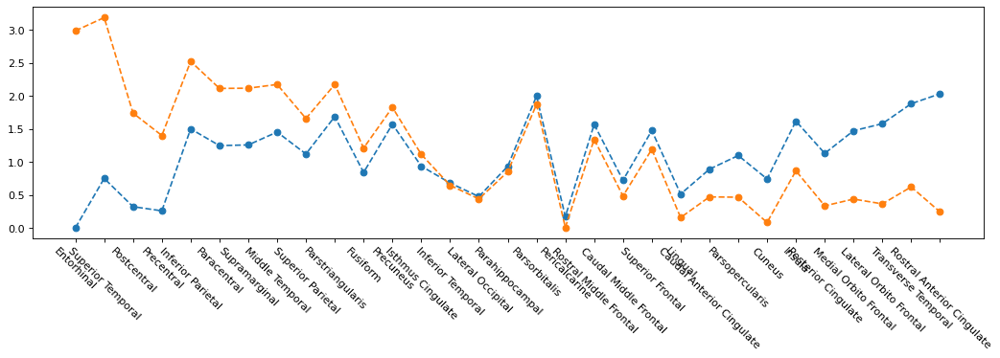

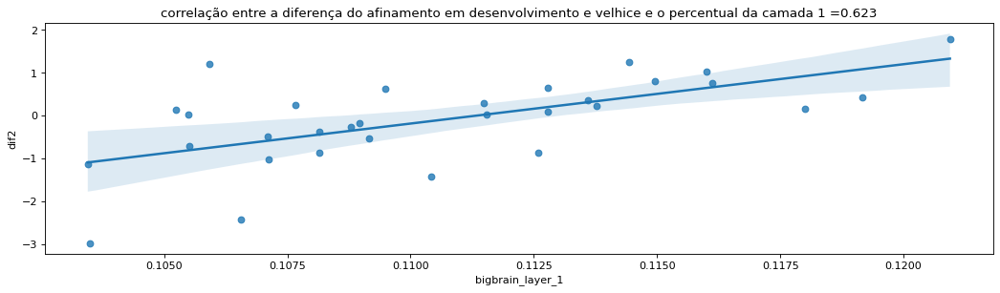

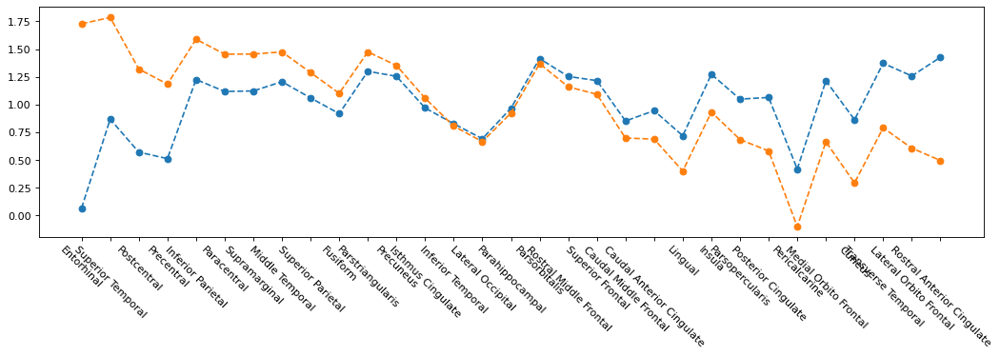

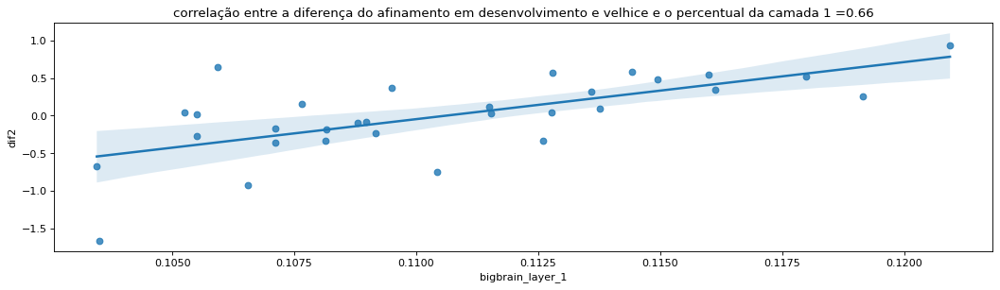

In [58]:
# calculando teste estatistico
df5_n = df5.copy()
df5_n['avg_rate1'] = df5['avg_rate1']/(df5['avg_rate1'].mean())
df5_n['avg_rate2'] = df5['avg_rate2']/(df5['avg_rate2'].mean())
df5_n['avg_rate3'] = df5['avg_rate3']/(df5['avg_rate3'].mean())

df5_n['dif2'] = df5_n.avg_rate1*df5_n.avg_rate1 - df5_n.avg_rate3*df5_n.avg_rate3
#df5_n['dif2'] = df5_n.avg_rate1 - df5_n.avg_rate3

x1 = -0.4 #[0.4;0.7]
x2 = -x1
g1 = df5_n[df5_n.dif2<x1]
g2 = df5_n[(df5_n.dif2>x1) & (df5_n.dif2<x2)]
g3 = df5_n[df5_n.dif2>x2]

print(len(g1), len(g2), len(g3))
print(g1.bigbrain_layer_1.mean(), g2.bigbrain_layer_1.mean(), g3.bigbrain_layer_1.mean())
from scipy import stats 
print(stats.kruskal(g1.bigbrain_layer_1,g2.bigbrain_layer_1,g2.bigbrain_layer_1)[1])
print(stats.f_oneway(g1.bigbrain_layer_1,g2.bigbrain_layer_1,g2.bigbrain_layer_1)[1])

# criando imagens
df5_n['dif2'] = df5_n.avg_rate1*df5_n.avg_rate1 - df5_n.avg_rate3*df5_n.avg_rate3
df5_n = df5_n.sort_values(by = 'dif2')
plt.figure(figsize=(16, 4), dpi=80)
plt.plot(df5_n.structure_name.astype(str), df5_n.avg_rate1*df5_n.avg_rate1, '--o') 
plt.plot(df5_n.structure_name.astype(str), df5_n.avg_rate3*df5_n.avg_rate3, '--o')
plt.xticks(rotation = -45) 
plt.show()

plt.figure(figsize=(16, 4), dpi=80)
corr = np.corrcoef(df5_n['bigbrain_layer_1'],df5_n.dif2)[0, 1]
sns.regplot(x='bigbrain_layer_1',y='dif2', data=df5_n).set(
    title="correlação entre a diferença do afinamento em desenvolvimento e velhice e o percentual da camada 1 ="+ str(np.round(corr,3)))
plt.show()

df5_n['dif2'] = df5_n.avg_rate1 - df5_n.avg_rate3
df5_n = df5_n.sort_values(by = 'dif2')
plt.figure(figsize=(16, 4), dpi=80)
plt.plot(df5_n.structure_name.astype(str), df5_n.avg_rate1, '--o') 
plt.plot(df5_n.structure_name.astype(str), df5_n.avg_rate3, '--o')
plt.xticks(rotation = -45) 
plt.show()

plt.figure(figsize=(16, 4), dpi=80)
corr = np.corrcoef(df5_n['bigbrain_layer_1'],df5_n.dif2)[0, 1]
sns.regplot(x='bigbrain_layer_1',y='dif2', data=df5_n).set(
    title="correlação entre a diferença do afinamento em desenvolvimento e velhice e o percentual da camada 1 ="+ str(np.round(corr,3)))
plt.show()

-------------

## 5. Old but important Code

##### 5.0 Graficos SHAP

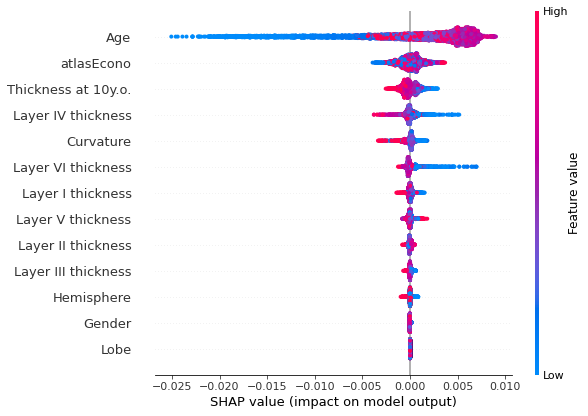

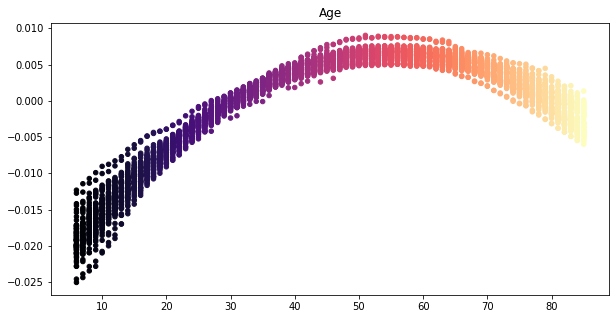

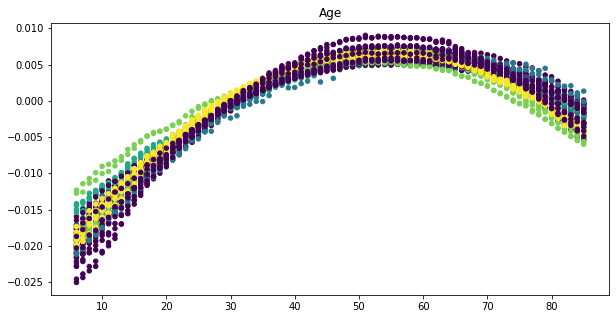

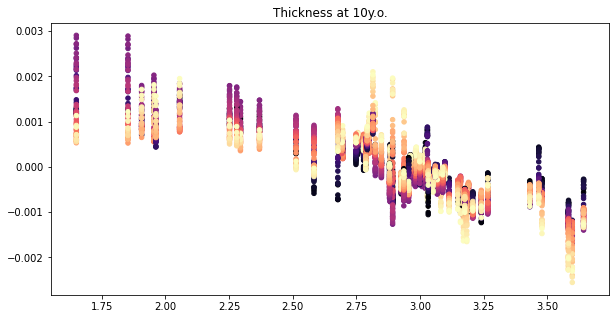

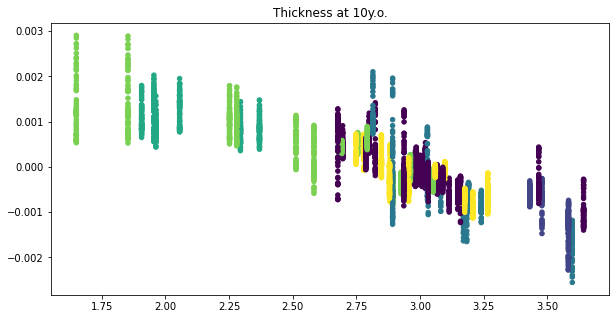

...

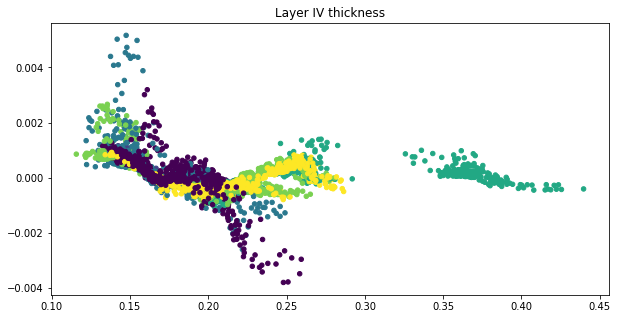

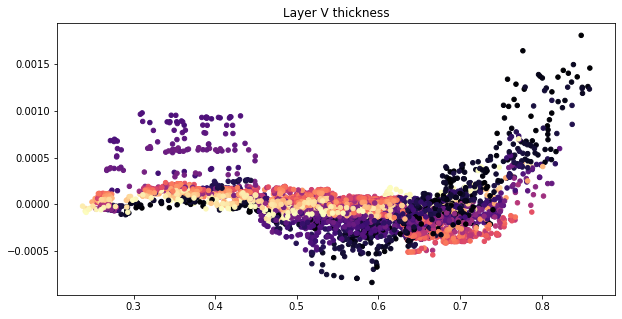

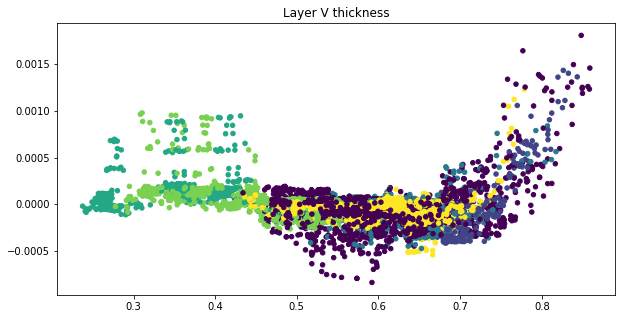

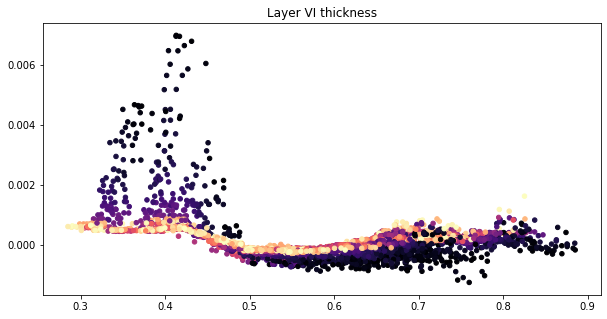

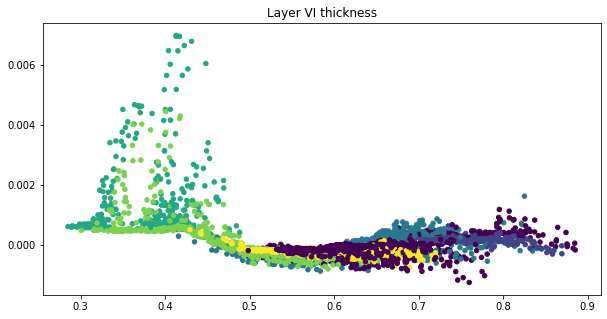

In [52]:
# Meus graficos Shaps feito por mim

# Final model
explainer = shap.Explainer(lgbm)
shap_info = explainer(X)

shap.summary_plot(shap_info)
shap.summary_plot(shap_info, plot_type='bar',color='purple')

for i in range(len(X.columns)):
    plt.figure(figsize=(10,5))
    plt.title(str(X.columns[i]))
    plt.scatter(shap_info.data[:,i], shap_info.values[:,i], alpha=1, c=X.Age, cmap=plt.cm.magma, s=20)
    plt.show()
    plt.figure(figsize=(10,5))
    plt.title(str(X.columns[i]))
    plt.scatter(shap_info.data[:,i], shap_info.values[:,i], alpha=1, c=X.Lobe, cmap=plt.cm.viridis, s=20)
    plt.show()
    
# Cross Validation models
model = 1
explainer = shap.Explainer(lgbm_dict_list[model][0])
shap_complete = explainer(X_train_dict_list[model][0])
X_train_info = X_train_dict_list[model][0]
for i in tqdm(explicables_index):
    explainer = shap.Explainer(lgbm_dict_list[model][i])
    shap_values = explainer(X_train_dict_list[model][i])
    shap_complete.values = np.append(shap_complete.values, shap_values.values,axis=0)
    shap_complete.base_values = np.append(shap_complete.base_values, shap_values.base_values,axis=0)
    shap_complete.data = np.append(shap_complete.data, shap_values.data,axis=0)
    # criado para definir a cor dos plots
    X_train_info = np.append(X_train_info, X_train_dict_list[model][i], axis=0)
    
# shap plot principal    
shap.summary_plot(shap_complete)
shap.summary_plot(shap_complete, plot_type='bar',color='purple')

for i in range(12):
    plt.figure(figsize=(10,5))
    plt.title(str(X.columns[i]))
    plt.scatter(shap_complete.data[:,i], shap_complete.values[:,i], alpha=1, c=X_train_info[:,0], cmap=plt.cm.magma, s=20)
    plt.show()
    plt.figure(figsize=(10,5))
    plt.title(str(X.columns[i]))
    plt.scatter(shap_complete.data[:,i], shap_complete.values[:,i], alpha=1, c=X_train_info[:,5], cmap=plt.cm.viridis, s=20)
    plt.show()

#### 2.5 Busca de hiperparametros

In [40]:
# escolhendo modelo de sera usado para busca de hiperparametros
model = 1
struture_index = 36
[X_train,X_test,y_train,y_test] = Xy_dict_list[model][struture_index]

# Tuning - find best hiper parameters
dtrain = opt_lgb.Dataset(X_train, y_train)
dvalidation = opt_lgb.Dataset(X_test, y_test)
params = {"metric": "rmse",
          "verbosity": -2,
          "boosting_type": "gbdt",
         }
model = opt_lgb.train(params, dtrain, valid_sets=dvalidation, verbose_eval=False)

print(model.params)
params = model.params.copy()
params

[I 2022-10-19 13:58:48,625] A new study created in memory with name: no-name-df2d97b9-dccb-40ea-97e3-e6d417f03fbd
bagging, val_score: 0.002457:  30%|###       | 3/10 [00:37<01:26, 12.38s/it][I 2022-10-19 14:04:12,916] Trial 29 finished with value: 0.002456515545358948 and parameters: {'bagging_fraction': 0.5812331919380156, 'bagging_freq': 5}. Best is trial 29 with value: 0.002456515545358948.


regularization_factors, val_score: 0.002274:  80%|########  | 16/20 [01:28<00:28,  7.03s/it][I 2022-10-19 14:07:26,113] Trial 55 finished with value: 0.002582774000832119 and parameters: {'lambda_l1': 1.6723133482812184e-05, 'lambda_l2': 6.782605109189135e-07}. Best is trial 42 with value: 0.0022744681796996544.


min_data_in_leaf, val_score: 0.002226: 100%|##########| 5/5 [00:05<00:00,  1.05s/it]

{'metric': 'rmse', 'verbosity': -2, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'lambda_l1': 0.06753088937926327, 'lambda_l2': 8.851226647425772e-07, 'num_leaves': 195, 'feature_fraction': 0.9840000000000001, 'bagging_fraction': 0.5437356108497445, 'bagging_freq': 2, 'min_child_samples': 50, 'num_iterations': 1000, 'early_stopping_round': None}


{'metric': 'rmse',
 'verbosity': -2,
 'boosting_type': 'gbdt',
 'feature_pre_filter': False,
 'lambda_l1': 0.06753088937926327,
 'lambda_l2': 8.851226647425772e-07,
 'num_leaves': 195,
 'feature_fraction': 0.9840000000000001,
 'bagging_fraction': 0.5437356108497445,
 'bagging_freq': 2,
 'min_child_samples': 50,
 'num_iterations': 1000,
 'early_stopping_round': None}

#### 5.1. Criando anualrate.parquet

In [ ]:
# freesufer data
mri_subs_all = pp.read_parquet(mri_subs_path)
print('freesufer data')

# drop zeros and encode cats
mri_subs = pp.clean(mri_subs_all)
print('drop zeros and encode cats')

# quality assessment
bad_participants = pp.find_bad_ones(mri_areas_path)
mri_subs = pp.eliminate_bad_ones(bad_participants, mri_subs)
print('quality assessment')

# add identification features
mri_subs = pp.cat2int(mri_subs, cat_features=['sex', 'handedness', 'hemisphere'])
print('add identification features')

# add h_atlasDF
mri_subs['h_atlasDF'] = mri_subs.hemisphere.astype(str) + mri_subs.atlasDF.astype(str)
print('add h_atlasDF')

# add name atlas
print('add name strutures')


# add bigbrain features
mri_subs = pp.bb_features(bb_path, mri_subs)
print('add bigbrain')

# h_atlasDF to int
mri_subs['h_atlasDF'] = mri_subs['h_atlasDF'].replace('0-1', '-1')
mri_subs['h_atlasDF'] = mri_subs['h_atlasDF'].replace('1-1', '-1')
mri_subs.h_atlasDF.unique()

# create dict_groupby 
dict_groupby = {}
keys = ['participant',  'age', 'sex', 'handedness',
        'hemisphere', 'atlasDF', 'area', 'curv','sulc', 'thickness', 
        'bigbrain_layer_1','bigbrain_layer_2','bigbrain_layer_3','bigbrain_layer_4','bigbrain_layer_5','bigbrain_layer_6']

for key in keys:
    dict_groupby[key] = []
dict_groupby['h_atlasDF'] = []
print('create dict_groupby')

for i, participant in enumerate(mri_subs.participant.unique()):
    
    df = mri_subs[mri_subs.participant == participant].groupby(['h_atlasDF']).mean()
    df['participant_i'] = i
    df['participant'] = participant
    print(i)
    
    for key in keys:
        dict_groupby[key].extend(df[key])
    dict_groupby['h_atlasDF'].extend(df.index)

df0 = pd.DataFrame(dict_groupby)

df0.to_parquet("/home/brunovieira/Tamires_Experiments/Bases_de_Dados/MRI_2_anualrate_894_v2.parquet")
df0.head()

#### 5.2. Criando Age_Stable.csv

In [ ]:
#derivada = taxa_anual.idxmax(axis=1)
#derivada = derivada.reset_index()
#derivada['hemisferio'] = [a[0] for a in derivada['atlasEcono']]
#derivada['atlasEcono'] = [a[1:] for a in derivada['atlasEcono']]
#derivada['bigest_slope'] = np.array(taxa_anual.min(axis=1))
#derivada = derivada.rename(columns={'atlasEcono':'econo',0:'age_stable'})
#derivada.to_csv('/home/brunovieira/Tamires_Experiments/Bases_de_Dados/Age_Stable.csv')